# **Brewery Operations and Market Analysis Dataset**

精釀啤酒生產中的釀造參數、銷售趨勢和品質指標綜合分析

#### **欄位說明**
**Batch_ID** :  識別ID  
**Brew_Date** :  釀造日期 (2020 - 2024)  
**Beer_Style** :  啤酒風格(酸 小麥 厚 波特)  
**SKU** :  包裝類型(罐子 瓶子 杯子)  
**Location** :  生產地點  
**Fermentation_Time** :  發酵天數(10 - 19天)  
**Temperature** :  發酵時的平均溫度(15 - 25攝氏)  
**pH_Level** :  啤酒的PH值(酸鹼度4.5 - 5.5)  
**Gravity** :  密度(雨水的比值1.03 - 1.08，水為1)  
**Alcohol_Content** :  酒精濃度(4.5 - 6%)  
**Bitterness** :   苦味(IBU標準20 - 59)  
**Color** :   啤酒色澤(SRM 5 - 19，越大越深)  
**Ingredient_Ratio** :   成份比例(RAW DATA說明不清)  
**Volume_Produced** :   該次生產量(500 - 4999公升)  
**Total_Sales** :  總銷售額(1000 - 20000單位)  
**Quality_Score** :  內部訂定品質分數(6-10分)  
**Brewhouse_Efficiency** :  釀造過程的效率(70 - 90% 越高越快)  
**Loss_During_Brewing** :  釀造期間體積損失(1 - 5%)  
**Loss_During_Fermentation** :  發酵期間體積損失(1 - 5%)  
**Loss_During_Bottling_Kegging** :  裝瓶或桶裝過程中體積損失(1 - 5%)  

In [1]:
#載入套件
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, pearsonr, spearmanr

# 讀入檔案
root = '/kaggle/input/brewery-operations-and-market-analysis-dataset/brewery_data_complete_extended.csv'
df = pd.read_csv(root)

## **基本資料探索**

In [2]:
#簡單檢視資料
df.sample(5)

,Batch_ID,Brew_Date,Beer_Style,SKU,Location,Fermentation_Time,Temperature,pH_Level,Gravity,Alcohol_Content,Bitterness,Color,Ingredient_Ratio,Volume_Produced,Total_Sales,Quality_Score,Brewhouse_Efficiency,Loss_During_Brewing,Loss_During_Fermentation,Loss_During_Bottling_Kegging
643836,8205332,2020-04-04 03:18:11,Pilsner,Bottles,Whitefield,14,19.687679,5.205598,1.046033,4.955608,33,18,1:0.23:0.26,2820,9527.617997,9.175147,86.864340,3.378970,1.588671,1.963698
599842,958598,2020-03-28 16:30:23,Ale,Bottles,Jayanagar,11,16.218259,4.987506,1.074490,5.495934,36,17,1:0.31:0.30,1816,5683.005684,9.294048,79.777532,2.118947,3.638195,3.794832
5818506,4565940,2022-04-30 02:59:27,Lager,Kegs,Jayanagar,13,19.514913,4.512826,1.057523,4.631573,54,11,1:0.34:0.23,4907,10239.875834,8.890576,87.839866,2.661231,4.766896,2.819536
3679871,1449261,2021-06-21 13:04:12,Ale,Cans,Indiranagar,19,16.588624,4.661292,1.062784,5.842846,47,7,1:0.25:0.29,1786,7790.868205,7.312546,70.310169,4.814852,1.569967,4.341702
4139130,4554126,2021-08-27 13:56:57,Sour,Cans,Yelahanka,19,21.870343,4.851127,1.056819,4.561226,37,5,1:0.34:0.13,4742,16199.553491,8.959544,80.137360,1.595750,3.764029,1.820425


In [3]:
#查看結構
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000000 entries, 0 to 9999999
Data columns (total 20 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   Batch_ID                      int64  
 1   Brew_Date                     object 
 2   Beer_Style                    object 
 3   SKU                           object 
 4   Location                      object 
 5   Fermentation_Time             int64  
 6   Temperature                   float64
 7   pH_Level                      float64
 8   Gravity                       float64
 9   Alcohol_Content               float64
 10  Bitterness                    int64  
 11  Color                         int64  
 12  Ingredient_Ratio              object 
 13  Volume_Produced               int64  
 14  Total_Sales                   float64
 15  Quality_Score                 float64
 16  Brewhouse_Efficiency          float64
 17  Loss_During_Brewing           float64
 18  Loss_During_Fermentat

In [4]:
#檢查缺失值
print(df.isnull().sum())

Batch_ID                        0
Brew_Date                       0
Beer_Style                      0
SKU                             0
Location                        0
Fermentation_Time               0
Temperature                     0
pH_Level                        0
Gravity                         0
Alcohol_Content                 0
Bitterness                      0
Color                           0
Ingredient_Ratio                0
Volume_Produced                 0
Total_Sales                     0
Quality_Score                   0
Brewhouse_Efficiency            0
Loss_During_Brewing             0
Loss_During_Fermentation        0
Loss_During_Bottling_Kegging    0
dtype: int64


In [5]:
# 統計量
df.describe()

,Batch_ID,Fermentation_Time,Temperature,pH_Level,Gravity,Alcohol_Content,Bitterness,Color,Volume_Produced,Total_Sales,Quality_Score,Brewhouse_Efficiency,Loss_During_Brewing,Loss_During_Fermentation,Loss_During_Bottling_Kegging
count,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07,1.000000e+07
mean,5.000000e+06,1.450090e+01,1.999990e+01,4.999941e+00,1.055003e+00,5.249709e+00,3.949620e+01,1.199935e+01,2.749031e+03,1.049779e+04,7.999825e+00,8.000092e+01,3.000081e+00,3.000002e+00,3.000159e+00
std,2.886751e+06,2.872006e+00,2.887030e+00,2.886376e-01,1.443465e-02,4.329614e-01,1.154557e+01,4.321170e+00,1.299078e+03,5.485996e+03,1.154679e+00,5.774930e+00,1.154748e+00,1.154827e+00,1.154719e+00
min,0.000000e+00,1.000000e+01,1.500000e+01,4.500000e+00,1.030000e+00,4.500000e+00,2.000000e+01,5.000000e+00,5.000000e+02,1.000001e+03,6.000001e+00,7.000001e+01,1.000000e+00,1.000001e+00,1.000000e+00
25%,2.500000e+06,1.200000e+01,1.749984e+01,4.750040e+00,1.042502e+00,4.874663e+00,2.900000e+01,8.000000e+00,1.623000e+03,5.747244e+03,6.999507e+00,7.499786e+01,2.000431e+00,1.999306e+00,2.000486e+00
50%,5.000000e+06,1.500000e+01,1.999977e+01,4.999885e+00,1.055004e+00,5.249849e+00,3.900000e+01,1.200000e+01,2.749000e+03,1.049629e+04,7.999932e+00,8.000250e+01,2.999722e+00,2.999761e+00,3.000721e+00
75%,7.499999e+06,1.700000e+01,2.250076e+01,5.249937e+00,1.067505e+00,5.624602e+00,4.900000e+01,1.600000e+01,3.874000e+03,1.524921e+04,8.999796e+00,8.500283e+01,4.000636e+00,4.000587e+00,4.000120e+00
max,9.999999e+06,1.900000e+01,2.500000e+01,5.500000e+00,1.080000e+00,6.000000e+00,5.900000e+01,1.900000e+01,4.999000e+03,2.000000e+04,9.999999e+00,9.000000e+01,5.000000e+00,5.000000e+00,5.000000e+00


In [6]:
# 類別探索
for col in df.select_dtypes(include=['object']).columns:
    print(f"Unique values in {col}:", df[col].unique())

Unique values in Brew_Date: ['2020-01-01 00:00:19' '2020-01-01 00:00:31' '2020-01-01 00:00:40' ...
 '2023-12-31 23:59:41' '2023-12-31 23:59:45' '2023-12-31 23:59:54']
Unique values in Beer_Style: ['Wheat Beer' 'Sour' 'Ale' 'Stout' 'Lager' 'Pilsner' 'IPA' 'Porter']
Unique values in SKU: ['Kegs' 'Cans' 'Pints' 'Bottles']
Unique values in Location: ['Whitefield' 'Malleswaram' 'Rajajinagar' 'Marathahalli' 'Electronic City'
 'Indiranagar' 'Koramangala' 'Yelahanka' 'Jayanagar' 'HSR Layout']
Unique values in Ingredient_Ratio: ['1:0.32:0.16' '1:0.39:0.24' '1:0.35:0.16' '1:0.35:0.15' '1:0.46:0.11'
 '1:0.23:0.15' '1:0.34:0.16' '1:0.45:0.26' '1:0.39:0.19' '1:0.43:0.17'
 '1:0.27:0.16' '1:0.44:0.25' '1:0.30:0.24' '1:0.24:0.14' '1:0.50:0.28'
 '1:0.47:0.12' '1:0.31:0.21' '1:0.32:0.28' '1:0.23:0.16' '1:0.34:0.14'
 '1:0.41:0.13' '1:0.43:0.16' '1:0.21:0.25' '1:0.49:0.10' '1:0.43:0.15'
 '1:0.49:0.26' '1:0.27:0.22' '1:0.37:0.13' '1:0.37:0.19' '1:0.22:0.27'
 '1:0.36:0.14' '1:0.44:0.20' '1:0.37:0.20' '1:0.2

In [2]:
#類別型特徵之類別計數
df['Brew_Date'] = pd.to_datetime(df['Brew_Date'])
df['Year'] = df['Brew_Date'].dt.year
print(df['Year'].value_counts())

print()
print(df['Beer_Style'].value_counts())
print()
print(df['SKU'].value_counts())
print()
print(df['Location'].value_counts())
print()

Year
2020    2505205
2023    2498896
2022    2497998
2021    2497901
Name: count, dtype: int64

Beer_Style
Ale           1251002
Porter        1250773
Sour          1250307
Stout         1250296
IPA           1249603
Lager         1249570
Pilsner       1249426
Wheat Beer    1249023
Name: count, dtype: int64

SKU
Bottles    2501597
Pints      2500873
Cans       2498777
Kegs       2498753
Name: count, dtype: int64

Location
HSR Layout         1000789
Jayanagar          1000760
Koramangala        1000220
Marathahalli       1000164
Rajajinagar        1000147
Indiranagar         999887
Yelahanka           999818
Malleswaram         999629
Electronic City     999307
Whitefield          999279
Name: count, dtype: int64



## **離散與連續連數間關係**

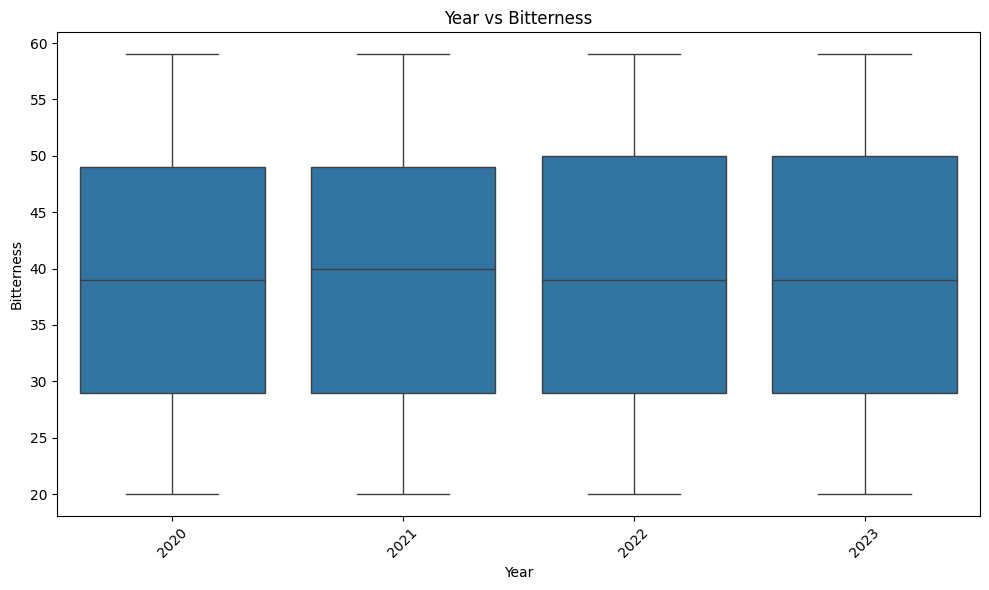

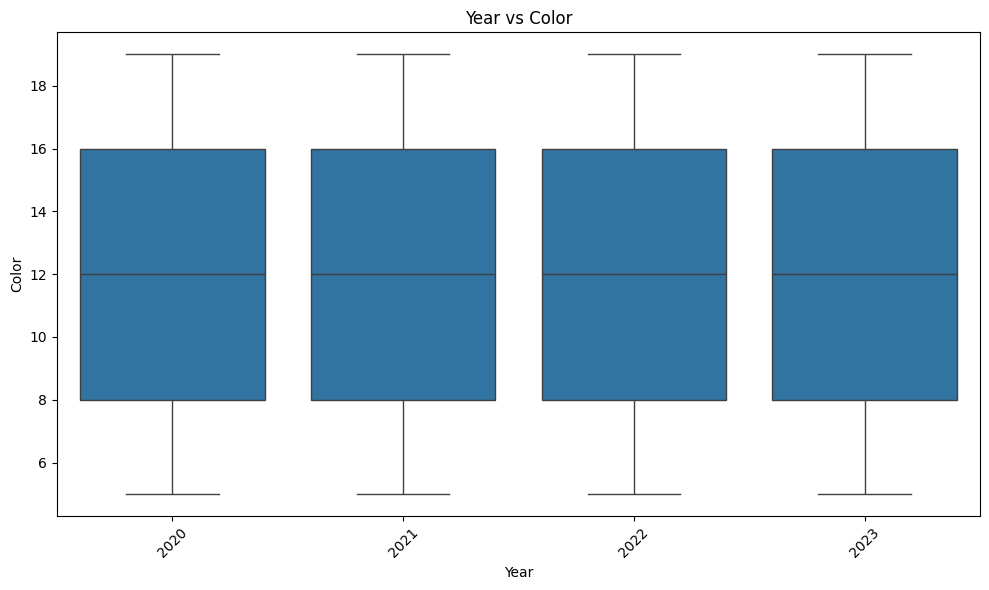

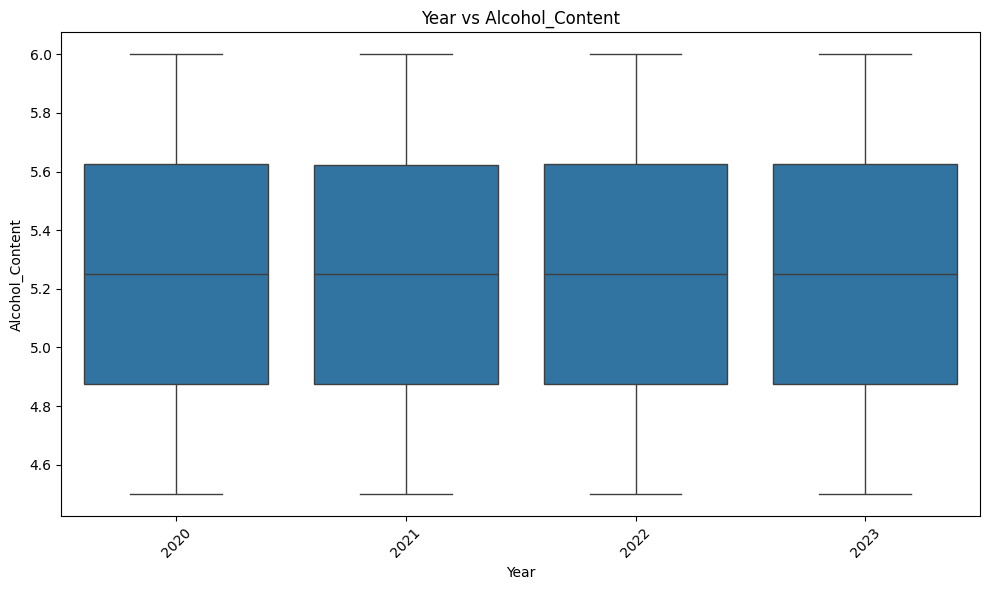

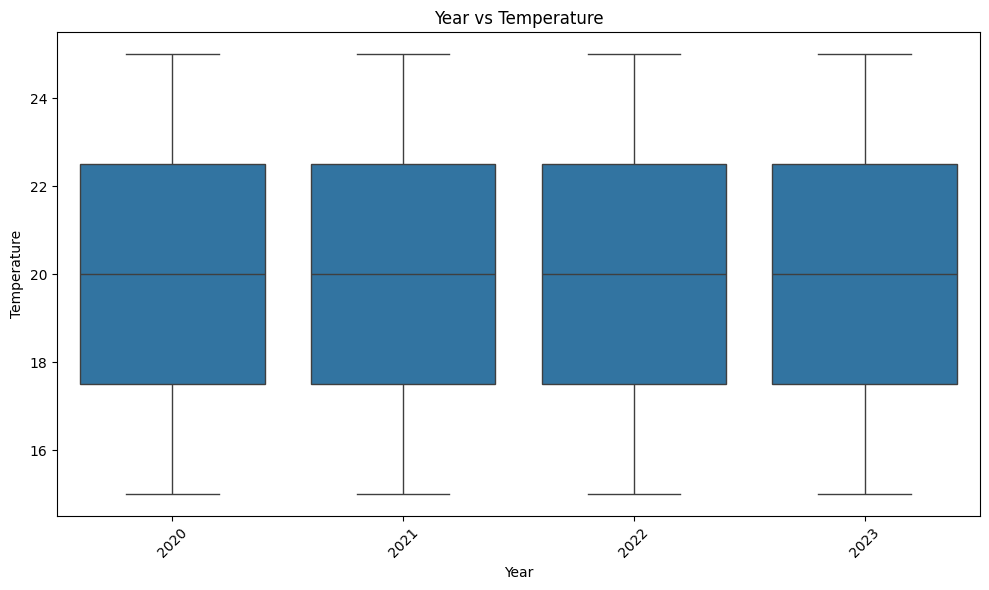

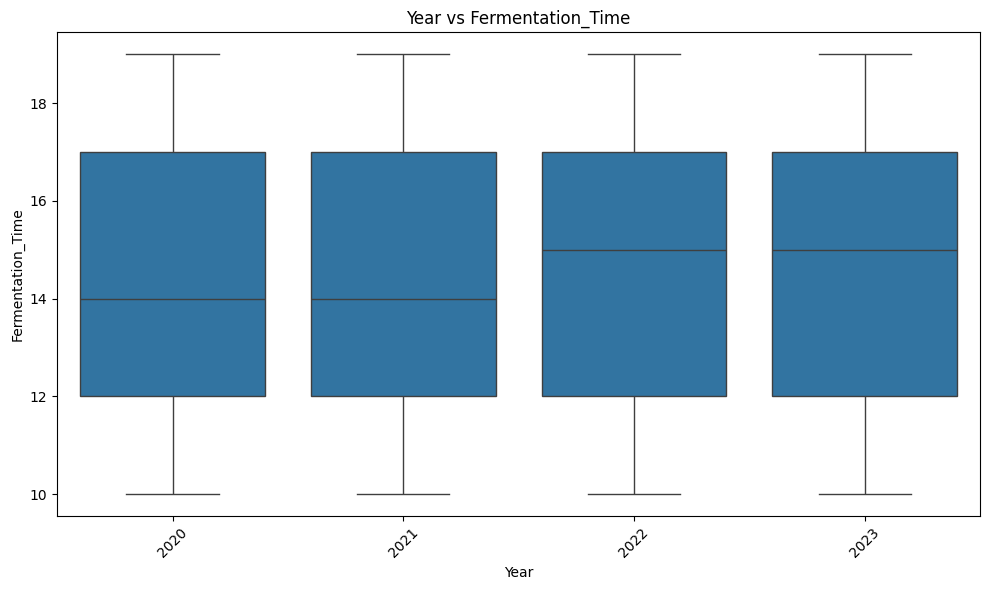

...

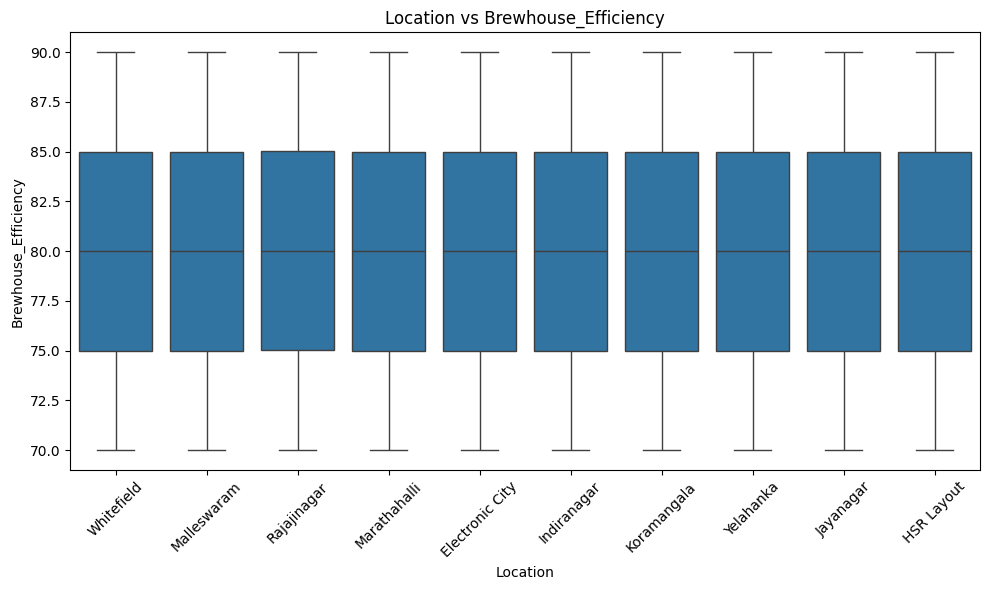

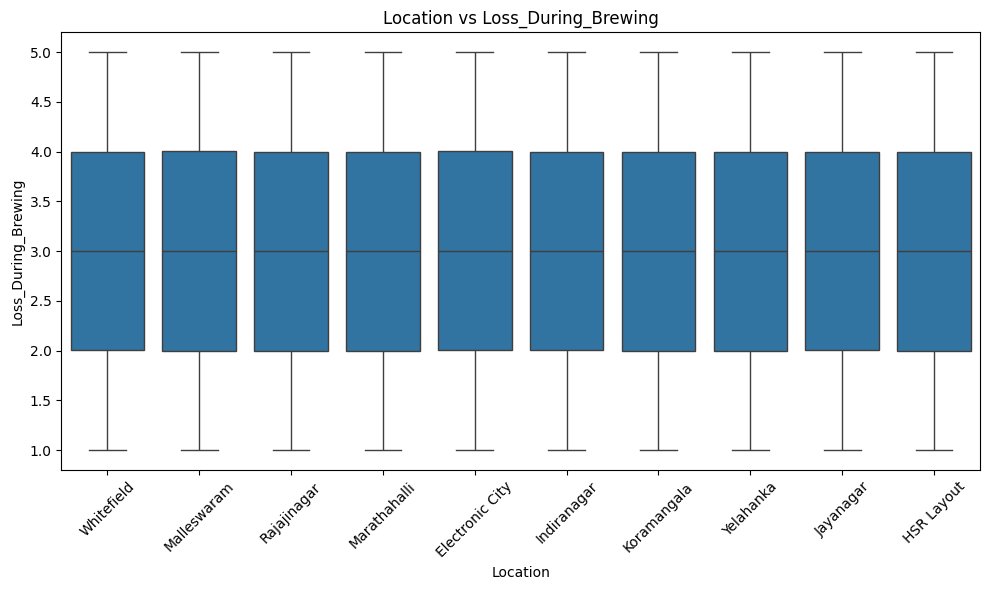

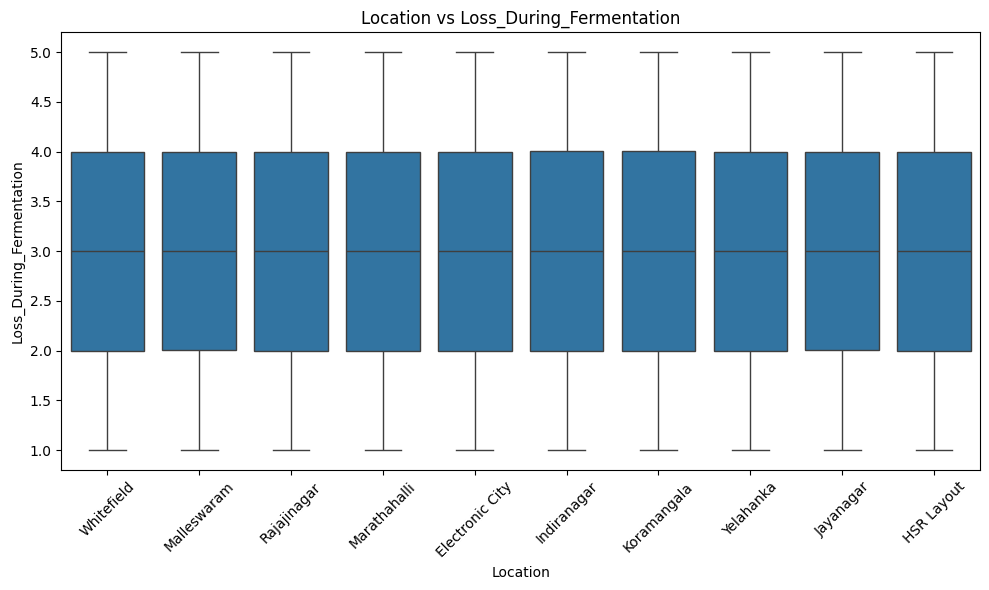

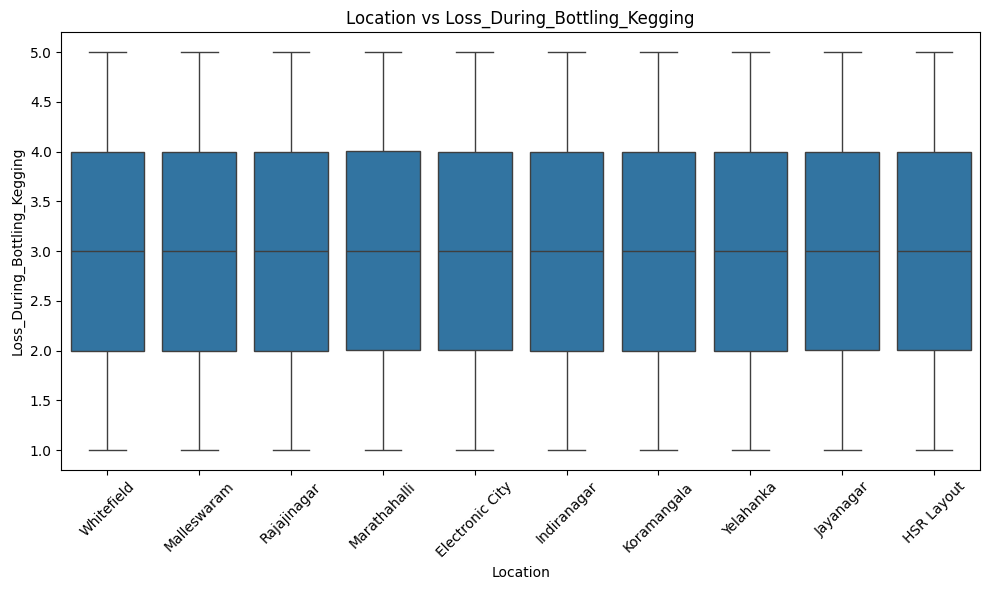

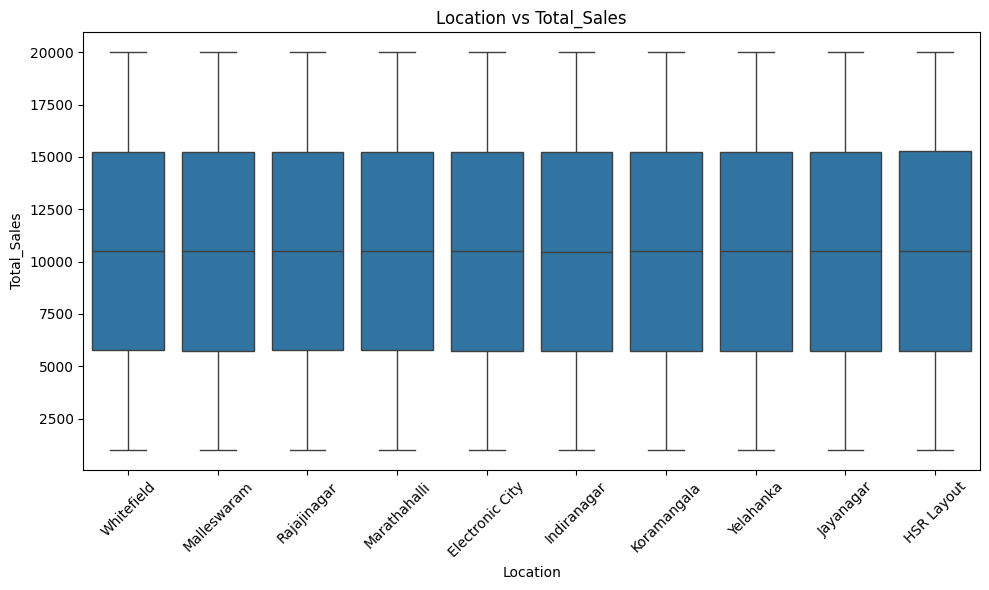

In [8]:
def plot_categorical_vs_numerical(df, categorical, numerical):
    """
    對於類別型與數值型特徵，繪製箱型圖來展示它們之間的關係。
    類別型在X軸，數值型在Y軸

    :param df: 主數據集。
    :param categorical: list，包含要在X軸展示的類別型特徵。
    :param numerical: list，包含要在Y軸展示的數值型特徵。
    """
    # 遍歷特徵列表
    for cat_feature in categorical:
        for num_feature in numerical:
            plt.figure(figsize=(10, 6))                         #為每對特徵創建一個新的圖形
            sns.boxplot(x=cat_feature, y=num_feature, data=df)  #使用箱型圖展示每個類別型特徵和數值型特徵之間的關係
            plt.title(f'{cat_feature} vs {num_feature}')        #設置圖表的標題
            plt.xticks(rotation=45)                             # 如果類別型特徵的標籤太長，旋轉45度以避免重疊
            plt.tight_layout()                                  #調整布局，確保所有元素都適合圖形窗口
            plt.show()

# 類別型特徵
categorical_features = ['Year','SKU','Beer_Style', 'Location']

# 數值型特徵
numerical_features = ['Bitterness','Color','Alcohol_Content','Temperature','Fermentation_Time','pH_Level','Gravity', 'Volume_Produced','Quality_Score','Brewhouse_Efficiency','Loss_During_Brewing','Loss_During_Fermentation','Loss_During_Bottling_Kegging','Total_Sales']
plot_categorical_vs_numerical(df, categorical_features, numerical_features)


<Axes: >

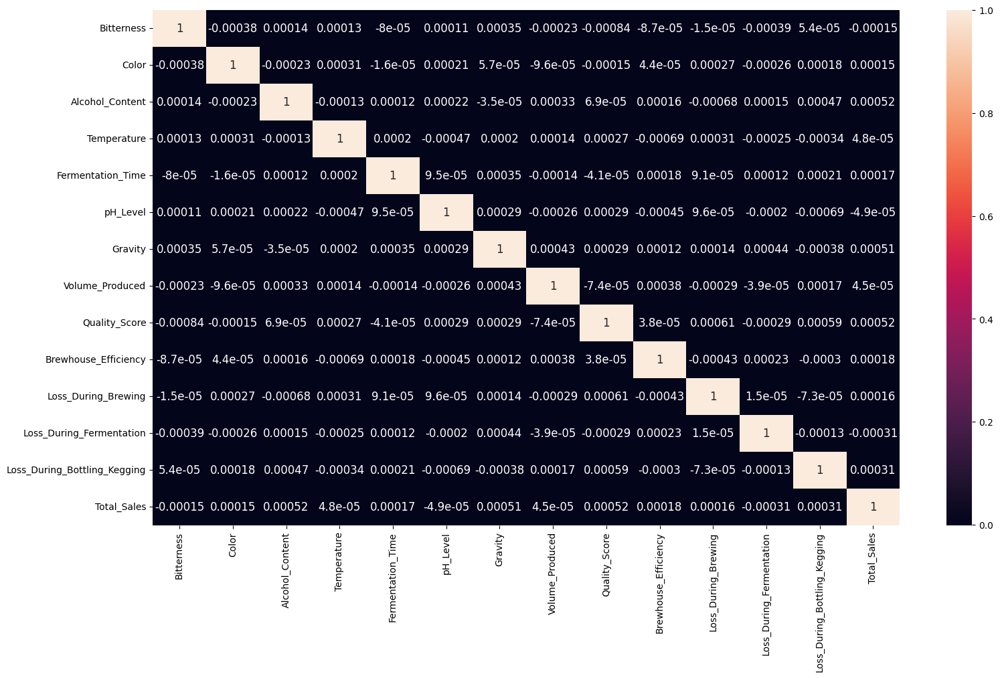

In [9]:
#熱力圖
selected_columns = df[['Bitterness', 'Color', 'Alcohol_Content', 'Temperature', 'Fermentation_Time', 'pH_Level', 'Gravity', 'Volume_Produced', 'Quality_Score', 'Brewhouse_Efficiency', 'Loss_During_Brewing', 'Loss_During_Fermentation', 'Loss_During_Bottling_Kegging', 'Total_Sales']]
corrmat = selected_columns.corr()
fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(corrmat, annot=True, annot_kws={'size': 12})


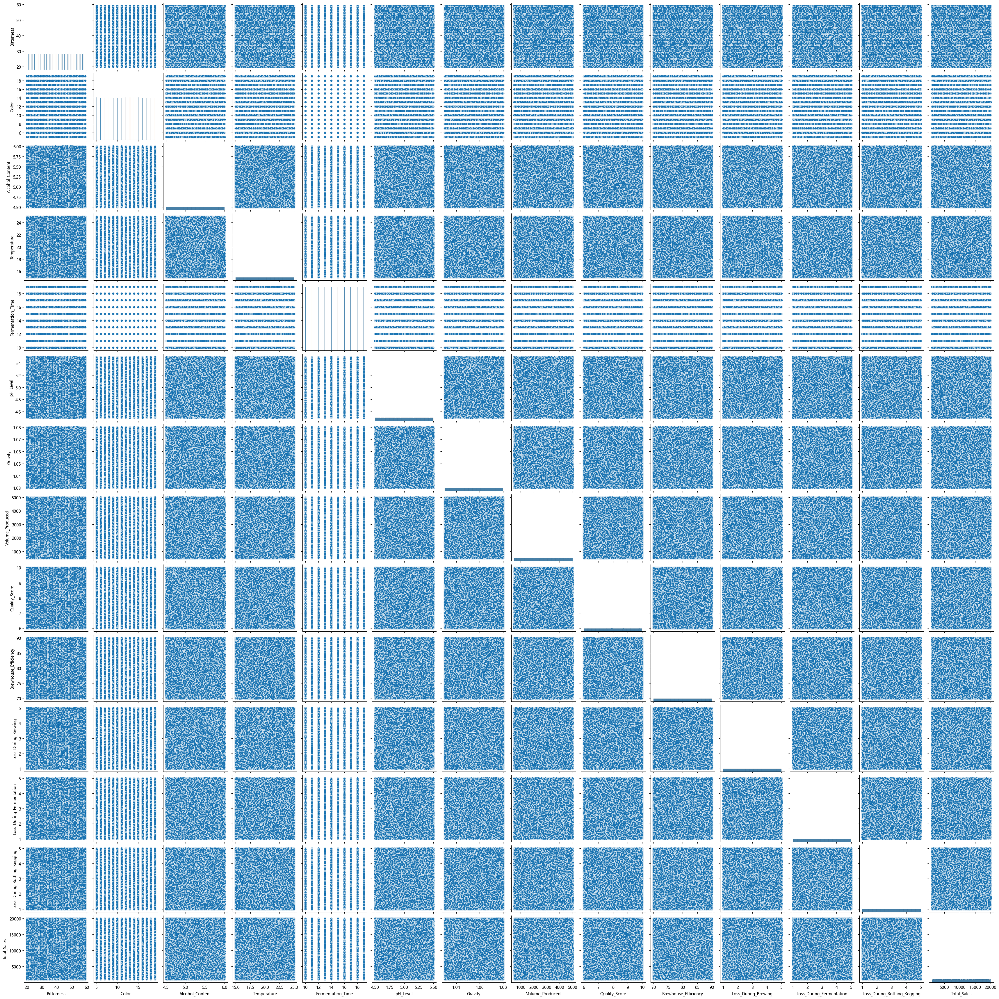

In [10]:
#連續型變數間散點圖
plt.rcParams['font.family'] = ['Microsoft YaHei']
sns.pairplot(df[['Bitterness', 'Color', 'Alcohol_Content', 'Temperature', 'Fermentation_Time', 'pH_Level', 'Gravity', 'Volume_Produced', 'Quality_Score', 'Brewhouse_Efficiency', 'Loss_During_Brewing', 'Loss_During_Fermentation', 'Loss_During_Bottling_Kegging', 'Total_Sales']])
plt.show()

### **統計檢定**

In [3]:
# 類別型特徵
categorical_features = ['Year','SKU','Beer_Style', 'Location']

# 數值型特徵
numerical_features = ['Bitterness','Color','Alcohol_Content','Temperature','Fermentation_Time','pH_Level','Gravity', 'Volume_Produced','Quality_Score','Brewhouse_Efficiency','Loss_During_Brewing','Loss_During_Fermentation','Loss_During_Bottling_Kegging','Total_Sales']


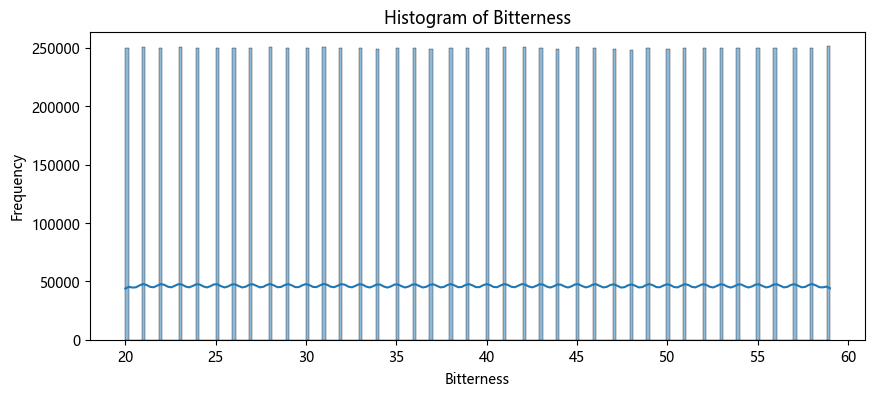

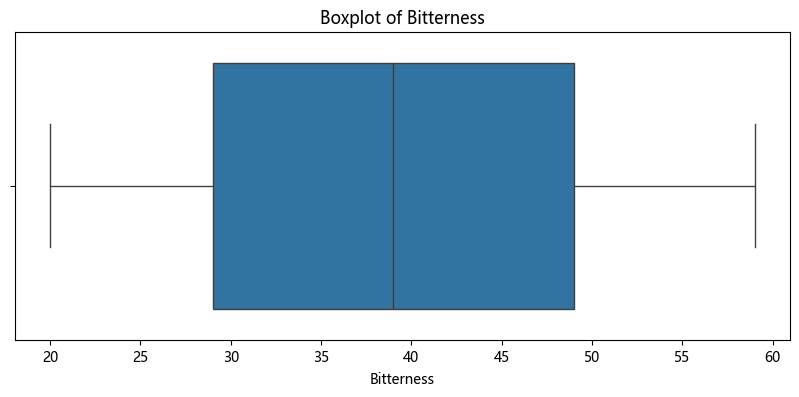

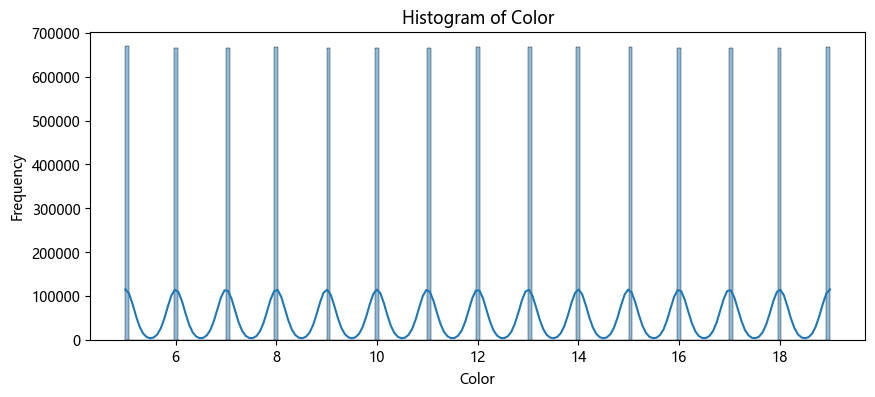

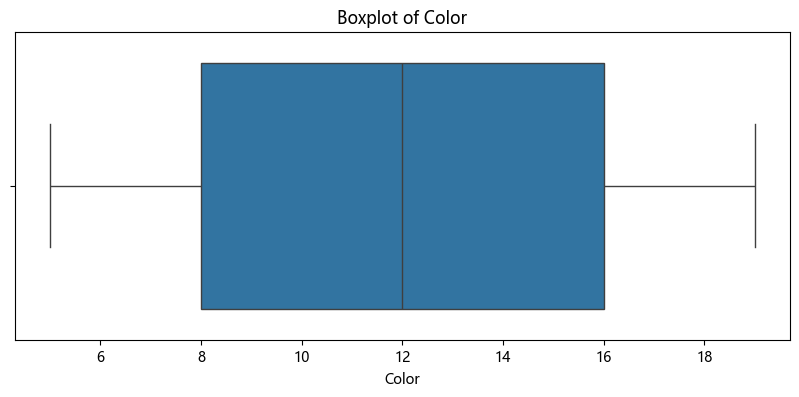

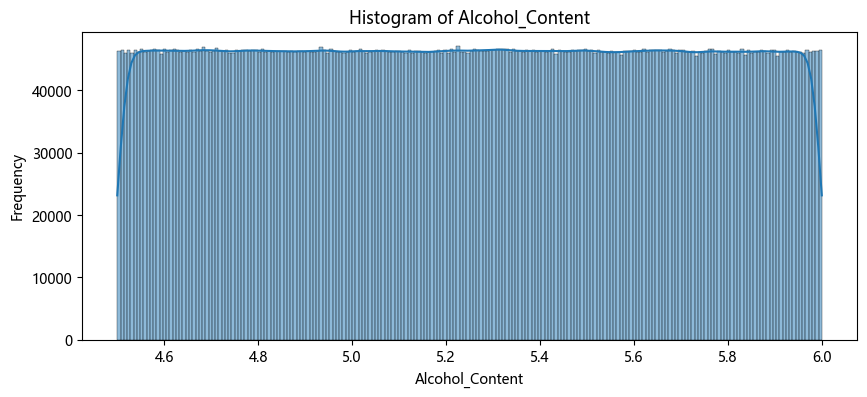

...

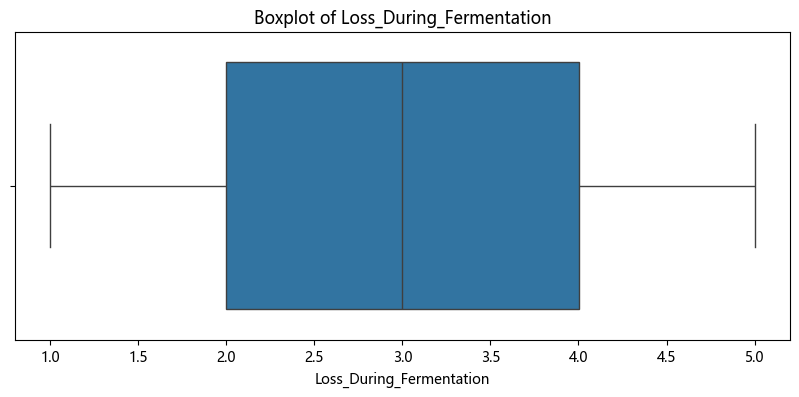

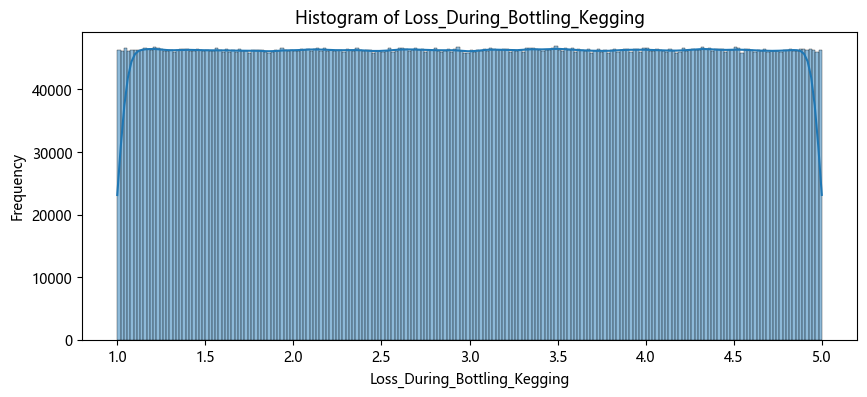

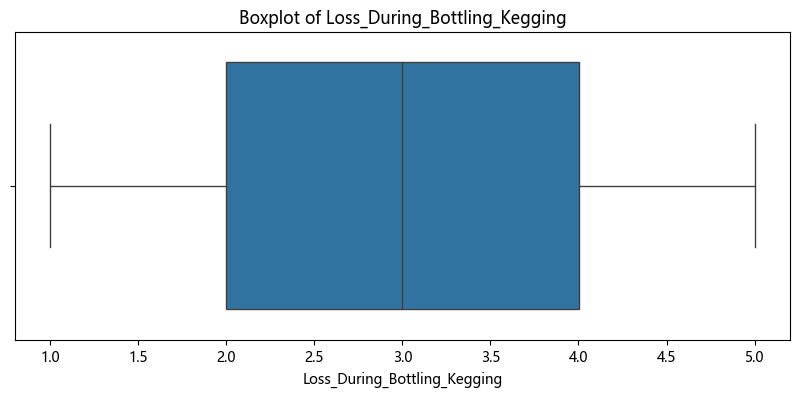

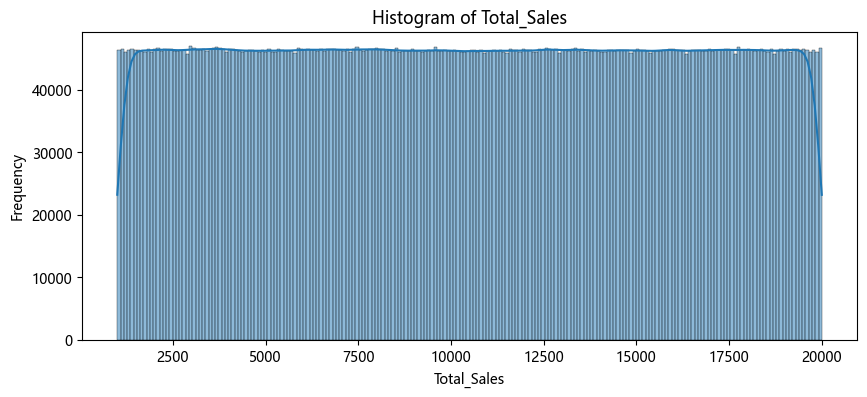

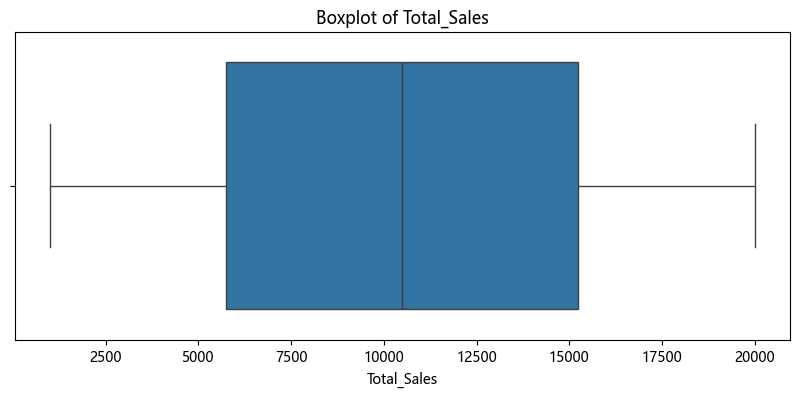

In [12]:
# 連續型變數分布
def plot_distribution(df, continuous_vars):
    """
    為連續型特徵繪製直方圖和箱形圖。

    :param df: pandas DataFrame，包含數據集。
    :param continuous_vars: 一個列表，包含連續型特徵。
    """
    for var in continuous_vars:
        # 繪製直方圖
        plt.figure(figsize=(10, 4))
        sns.histplot(df[var], kde=True)
        plt.title(f'Histogram of {var}')
        plt.xlabel(var)
        plt.ylabel('Frequency')
        plt.show()

        # 繪製箱形圖
        plt.figure(figsize=(10, 4))
        sns.boxplot(x=df[var])
        plt.title(f'Boxplot of {var}')
        plt.xlabel(var)
        plt.show()

plot_distribution(df, numerical_features)


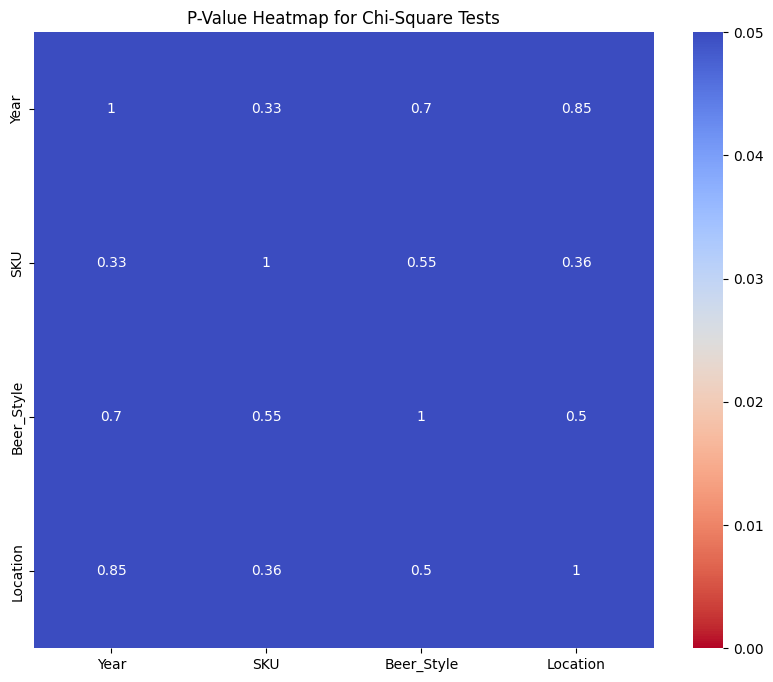

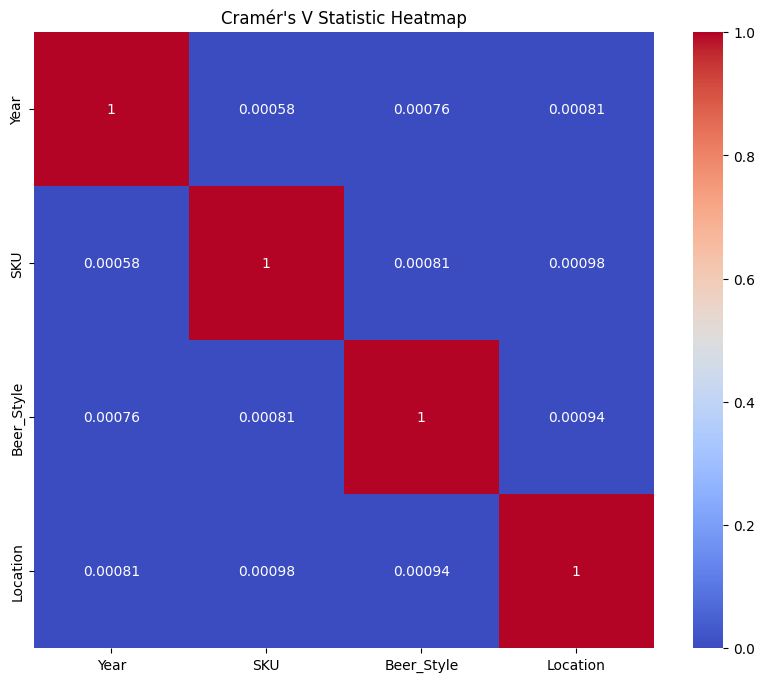

In [11]:
#卡方檢定 離散型變數間關係
def cramers_v(chi2, n, shape):
    return np.sqrt(chi2 / (n * min(shape[0] - 1, shape[1] - 1)))

def chi_square_test_with_cramers_v(df, categorical_vars):
    p_value_matrix = pd.DataFrame(index=categorical_vars, columns=categorical_vars)
    cramers_v_matrix = pd.DataFrame(index=categorical_vars, columns=categorical_vars)

    for var1 in categorical_vars:
        for var2 in categorical_vars:
            if var1 != var2:
                ct = pd.crosstab(df[var1], df[var2])
                chi2, p, dof, ex = chi2_contingency(ct)
                p_value_matrix.loc[var1, var2] = p
                cramers_v_value = cramers_v(chi2, df.shape[0], ct.shape)
                cramers_v_matrix.loc[var1, var2] = cramers_v_value
            else:
                p_value_matrix.loc[var1, var2] = 1  # 對角線填1
                cramers_v_matrix.loc[var1, var2] = 1  # 對角線填1

    # P值熱力圖
    plt.figure(figsize=(10, 8))
    sns.heatmap(p_value_matrix.astype(float), annot=True, cmap='coolwarm_r', vmin=0, vmax=0.05)
    plt.title("P-Value Heatmap for Chi-Square Tests")
    plt.show()

    # Cramér's V熱力圖
    plt.figure(figsize=(10, 8))
    sns.heatmap(cramers_v_matrix.astype(float), annot=True, cmap='coolwarm', vmin=0, vmax=1)
    plt.title("Cramér's V Statistic Heatmap")
    plt.show()

chi_square_test_with_cramers_v(df, categorical_features)



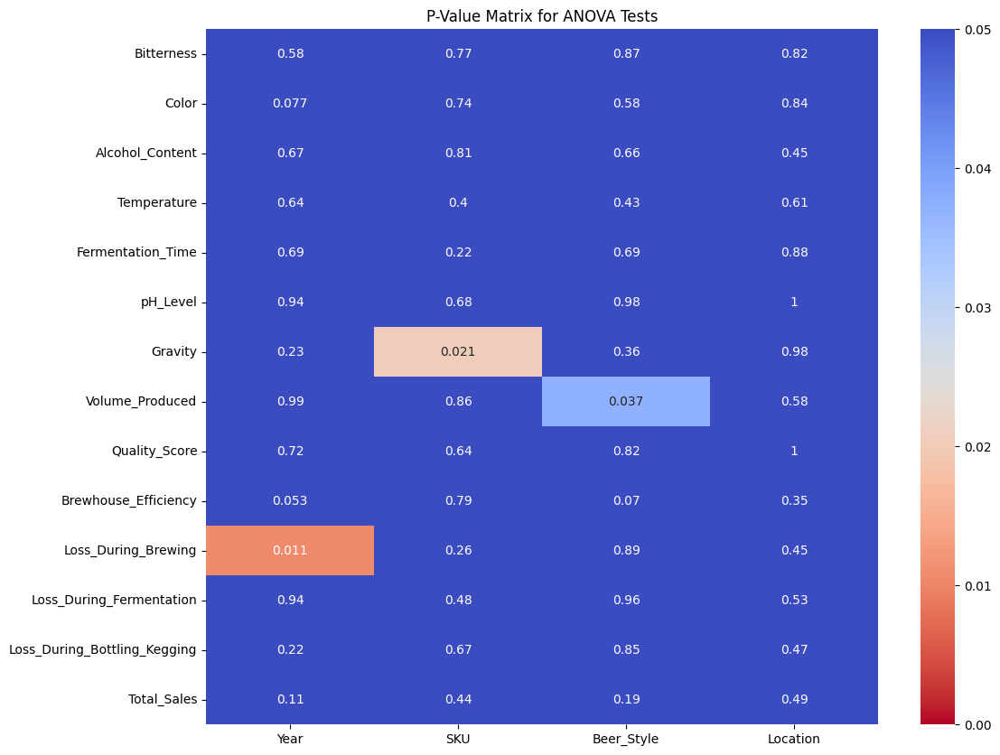

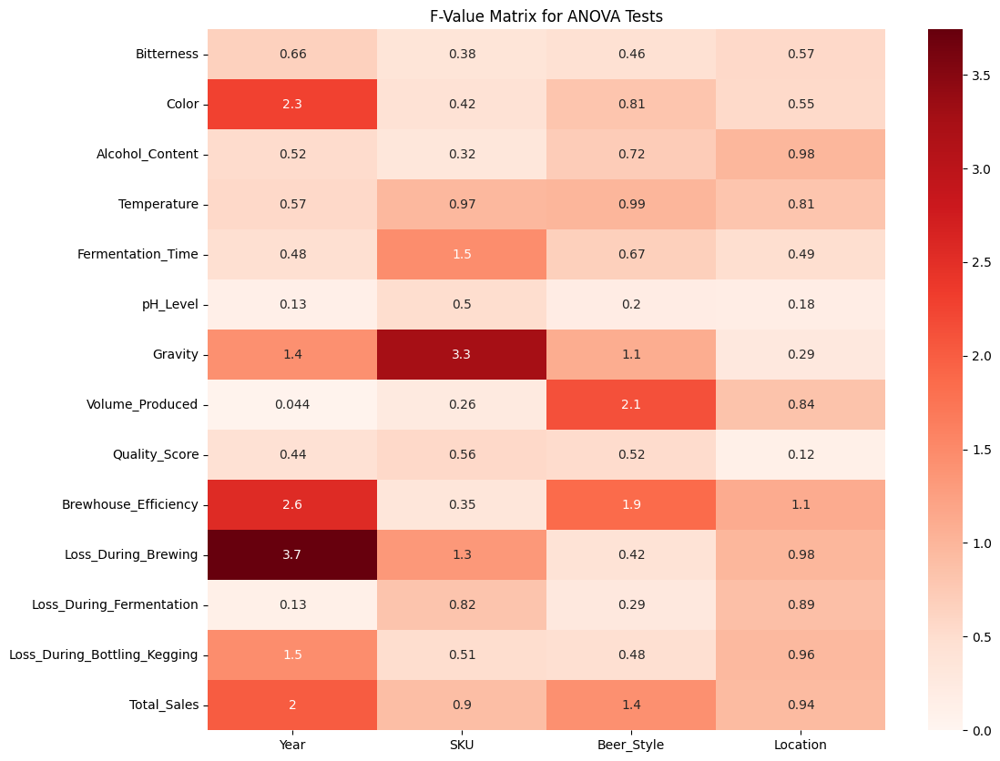

(                                  Year       SKU Beer_Style  Location
 Bitterness                     0.57675  0.768942   0.866462  0.824026
 Color                         0.077443  0.735098   0.577256  0.841507
 Alcohol_Content               0.670968  0.808498   0.657864  0.454398
 Temperature                   0.638042  0.404546   0.433141  0.607907
 Fermentation_Time             0.694708   0.22016   0.693935   0.88187
 pH_Level                      0.941104    0.6834   0.984959  0.996096
 Gravity                       0.234512  0.020603   0.356822  0.978525
 Volume_Produced               0.987796  0.855682   0.037271  0.579417
 Quality_Score                 0.724264  0.643308   0.819976  0.999247
 Brewhouse_Efficiency           0.05325  0.788644   0.069998  0.349294
 Loss_During_Brewing            0.01056   0.26112   0.889692  0.454448
 Loss_During_Fermentation      0.942709  0.481068   0.957323  0.533572
 Loss_During_Bottling_Kegging   0.22154  0.674992    0.85056  0.471832
 Total

In [8]:
# ANOVA測試
def anova_test_matrix(df, categorical_features, numerical_features):
    p_value_matrix = pd.DataFrame(index=numerical_features, columns=categorical_features)
    f_value_matrix = pd.DataFrame(index=numerical_features, columns=categorical_features)

    for cat_var in categorical_features:
        unique_categories = df[cat_var].unique()
        if len(unique_categories) > 1:  # 确保有多于一个类别
            for cont_var in numerical_features:
                groups = [df[df[cat_var] == category][cont_var] for category in unique_categories]
                f_value, p_value = stats.f_oneway(*groups)
                p_value_matrix.loc[cont_var, cat_var] = p_value
                f_value_matrix.loc[cont_var, cat_var] = f_value
        else:
            p_value_matrix[cat_var] = np.nan
            f_value_matrix[cat_var] = np.nan

    # p值矩阵
    plt.figure(figsize=(12, 10))
    sns.heatmap(p_value_matrix.astype(float), annot=True, cmap='coolwarm_r', vmin=0, vmax=0.05)
    plt.title('P-Value Matrix for ANOVA Tests')
    plt.show()

    # F值矩阵
    plt.figure(figsize=(12, 10))
    sns.heatmap(f_value_matrix.astype(float), annot=True, cmap='Reds', vmin=0)
    plt.title('F-Value Matrix for ANOVA Tests')
    plt.show()

    return p_value_matrix, f_value_matrix

anova_test_matrix(df, categorical_features, numerical_features)



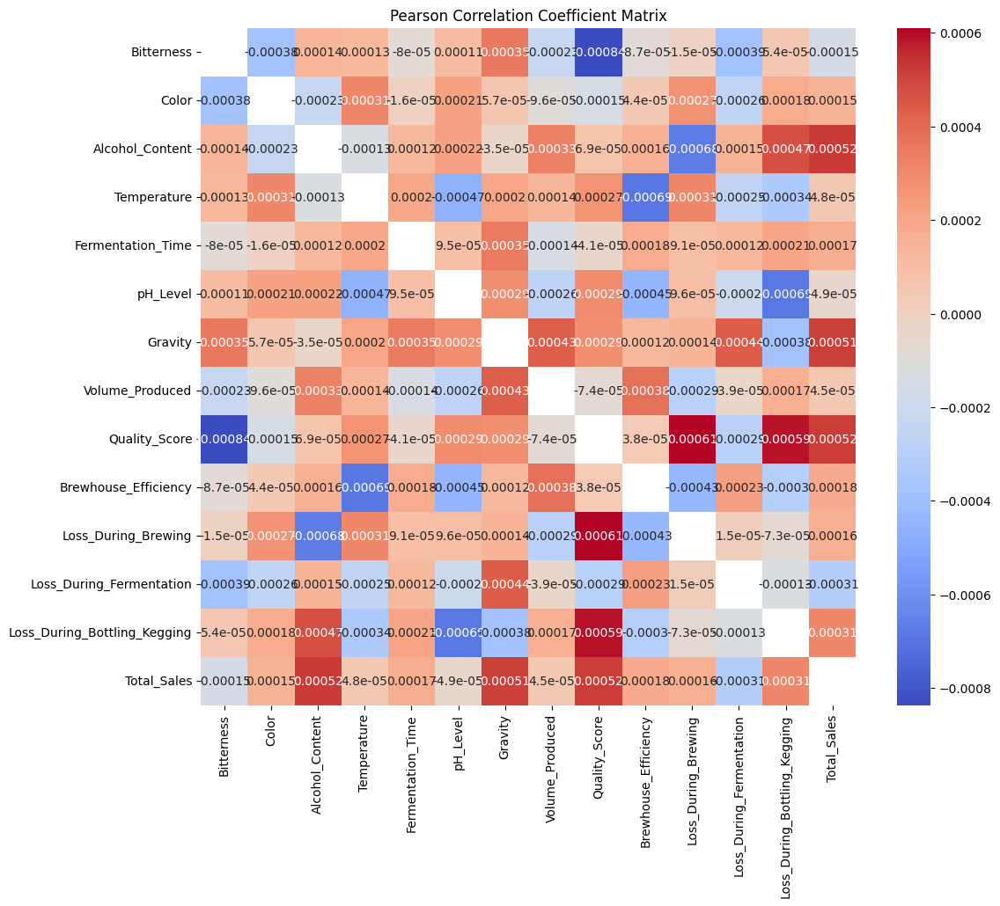

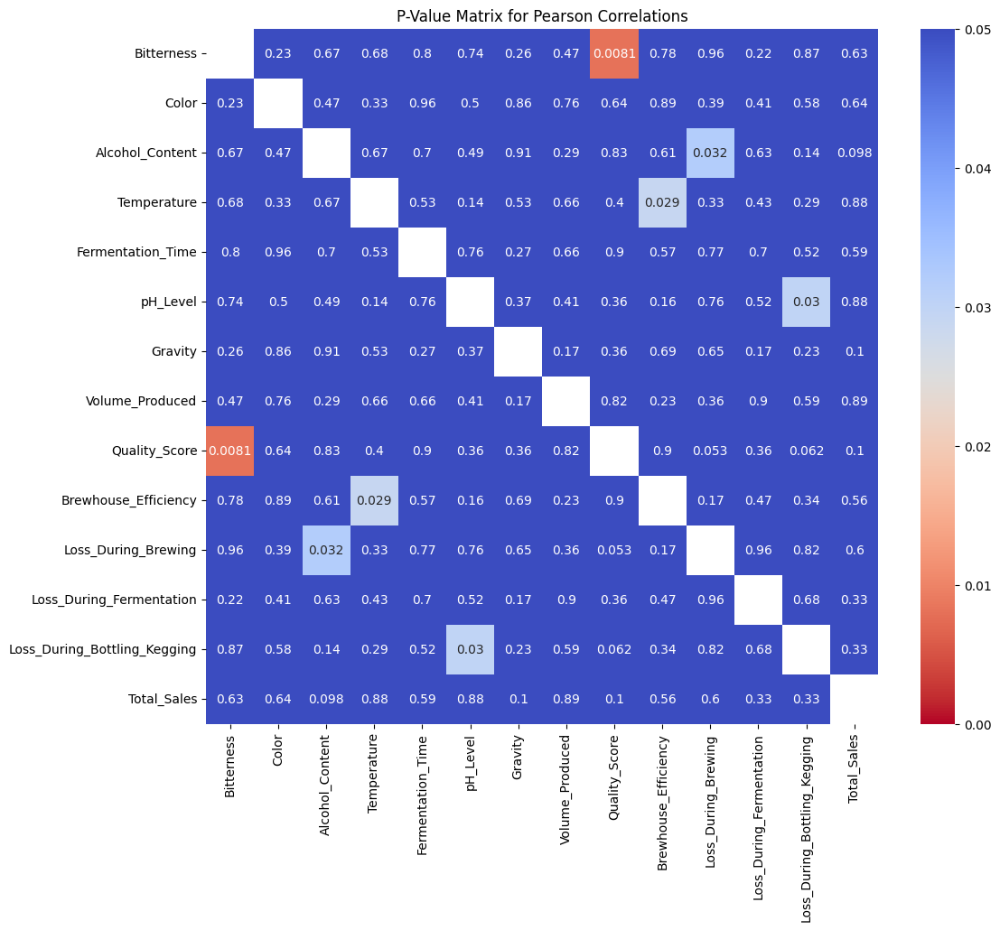

(                             Bitterness     Color Alcohol_Content Temperature  \
 Bitterness                          NaN -0.000383        0.000137     0.00013   
 Color                         -0.000383       NaN       -0.000229    0.000309   
 Alcohol_Content                0.000137 -0.000229             NaN   -0.000134   
 Temperature                     0.00013  0.000309       -0.000134         NaN   
 Fermentation_Time              -0.00008 -0.000016        0.000124    0.000198   
 pH_Level                       0.000107  0.000215         0.00022   -0.000465   
 Gravity                        0.000353  0.000057       -0.000035    0.000198   
 Volume_Produced                -0.00023 -0.000096        0.000333    0.000139   
 Quality_Score                 -0.000837 -0.000149        0.000069    0.000266   
 Brewhouse_Efficiency          -0.000087  0.000044        0.000161   -0.000691   
 Loss_During_Brewing           -0.000015  0.000272       -0.000678    0.000307   
 Loss_During_Fer

In [13]:
#Pearson- 連續型變數間線性關係
def pearson_correlation_matrix(df, continuous_vars):
    corr_matrix = pd.DataFrame(index=continuous_vars, columns=continuous_vars)
    p_value_matrix = pd.DataFrame(index=continuous_vars, columns=continuous_vars)

    for i, var1 in enumerate(continuous_vars):
        for j, var2 in enumerate(continuous_vars):
            if i != j:  
                corr, p = pearsonr(df[var1], df[var2])
                corr_matrix.loc[var1, var2] = corr
                corr_matrix.loc[var2, var1] = corr  
                p_value_matrix.loc[var1, var2] = p
                p_value_matrix.loc[var2, var1] = p 

    # 相關係數熱力圖
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix.astype(float), annot=True, cmap='coolwarm')
    plt.title('Pearson Correlation Coefficient Matrix')
    plt.show()
    
    # p值矩阵
    plt.figure(figsize=(12, 10))
    sns.heatmap(p_value_matrix.astype(float), annot=True, cmap='coolwarm_r', vmin=0, vmax=0.05)
    plt.title('P-Value Matrix for Pearson Correlations')
    plt.show()


    return corr_matrix, p_value_matrix

# 使用示例
pearson_correlation_matrix(df, numerical_features)


Spearman Rank Correlation Coefficients:


,Bitterness,Color,Alcohol_Content,Temperature,Fermentation_Time,pH_Level,Gravity,Volume_Produced,Quality_Score,Brewhouse_Efficiency,Loss_During_Brewing,Loss_During_Fermentation,Loss_During_Bottling_Kegging,Total_Sales
Bitterness,1,-0.000382,0.000137,0.00013,-0.00008,0.000106,0.000353,-0.00023,-0.000837,-0.000087,-0.000015,-0.000387,0.000054,-0.000154
Color,-0.000382,1,-0.000229,0.000309,-0.000016,0.000215,0.000057,-0.000097,-0.000149,0.000044,0.000272,-0.000259,0.000177,0.000147
Alcohol_Content,0.000137,-0.000229,1,-0.000133,0.000123,0.00022,-0.000035,0.000333,0.000069,0.000161,-0.000678,0.000152,0.000471,0.000522
Temperature,0.00013,0.000309,-0.000133,1,0.000198,-0.000465,0.000198,0.000139,0.000266,-0.000691,0.000307,-0.00025,-0.000335,0.000048
Fermentation_Time,-0.00008,-0.000016,0.000123,0.000198,1,0.000095,0.000347,-0.000138,-0.000041,0.000179,0.000091,0.000122,0.000206,0.00017
pH_Level,0.000106,0.000215,0.00022,-0.000465,0.000095,1,0.000285,-0.000263,0.000289,-0.000447,0.000096,-0.000203,-0.000686,-0.000048
Gravity,0.000353,0.000057,-0.000035,0.000198,0.000347,0.000285,1,0.000432,0.000288,0.000124,0.000143,0.000436,-0.000382,0.000514
Volume_Produced,-0.00023,-0.000097,0.000333,0.000139,-0.000138,-0.000263,0.000432,1,-0.000074,0.00038,-0.000288,-0.000039,0.000169,0.000046
Quality_Score,-0.000837,-0.000149,0.000069,0.000266,-0.000041,0.000289,0.000288,-0.000074,1,0.000038,0.000611,-0.00029,0.000591,0.000517
Brewhouse_Efficiency,-0.000087,0.000044,0.000161,-0.000691,0.000179,-0.000447,0.000124,0.00038,0.000038,1,-0.000431,0.00023,-0.000303,0.000185


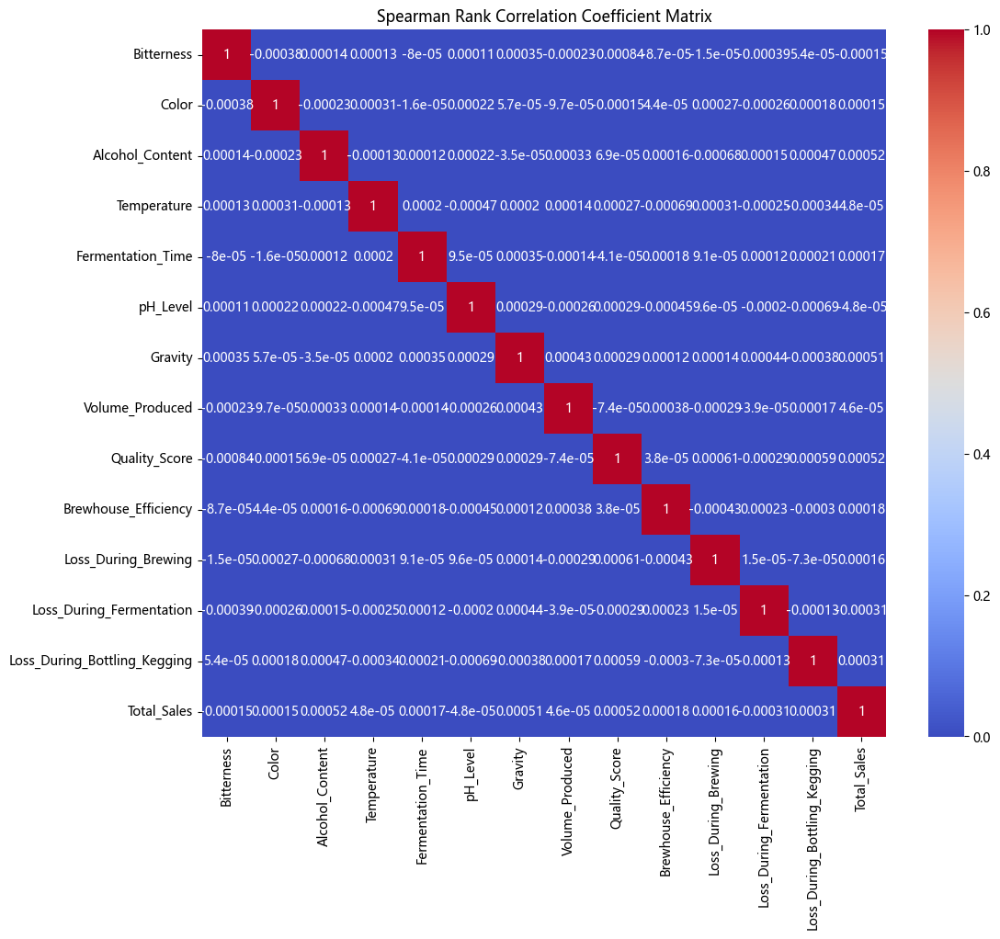


P-values for Correlations:


,Bitterness,Color,Alcohol_Content,Temperature,Fermentation_Time,pH_Level,Gravity,Volume_Produced,Quality_Score,Brewhouse_Efficiency,Loss_During_Brewing,Loss_During_Fermentation,Loss_During_Bottling_Kegging,Total_Sales
Bitterness,0,0.226632,0.664862,0.681712,0.799299,0.736285,0.264314,0.466585,0.008136,0.783768,0.961666,0.220927,0.865046,0.625689
Color,0.226632,0,0.4687,0.328257,0.959614,0.496375,0.857497,0.759921,0.636549,0.889308,0.390327,0.413565,0.576229,0.642639
Alcohol_Content,0.664862,0.4687,0,0.673153,0.696349,0.486977,0.912308,0.29259,0.8261,0.611369,0.032019,0.630044,0.136636,0.098564
Temperature,0.681712,0.328257,0.673153,0,0.531522,0.141338,0.531024,0.660349,0.399514,0.028946,0.332115,0.429743,0.289326,0.878931
Fermentation_Time,0.799299,0.959614,0.696349,0.531522,0,0.764383,0.272119,0.662351,0.896253,0.57047,0.773215,0.698588,0.515395,0.590739
pH_Level,0.736285,0.496375,0.486977,0.141338,0.764383,0,0.36719,0.405337,0.360001,0.157624,0.760757,0.520605,0.030034,0.87819
Gravity,0.264314,0.857497,0.912308,0.531024,0.272119,0.36719,0,0.172005,0.362076,0.693901,0.651494,0.167604,0.226531,0.103813
Volume_Produced,0.466585,0.759921,0.29259,0.660349,0.662351,0.405337,0.172005,0,0.815351,0.229958,0.361861,0.901534,0.592262,0.885485
Quality_Score,0.008136,0.636549,0.8261,0.399514,0.896253,0.360001,0.362076,0.815351,0,0.903217,0.0534,0.358447,0.061719,0.102117
Brewhouse_Efficiency,0.783768,0.889308,0.611369,0.028946,0.57047,0.157624,0.693901,0.229958,0.903217,0,0.172846,0.466173,0.338565,0.558941


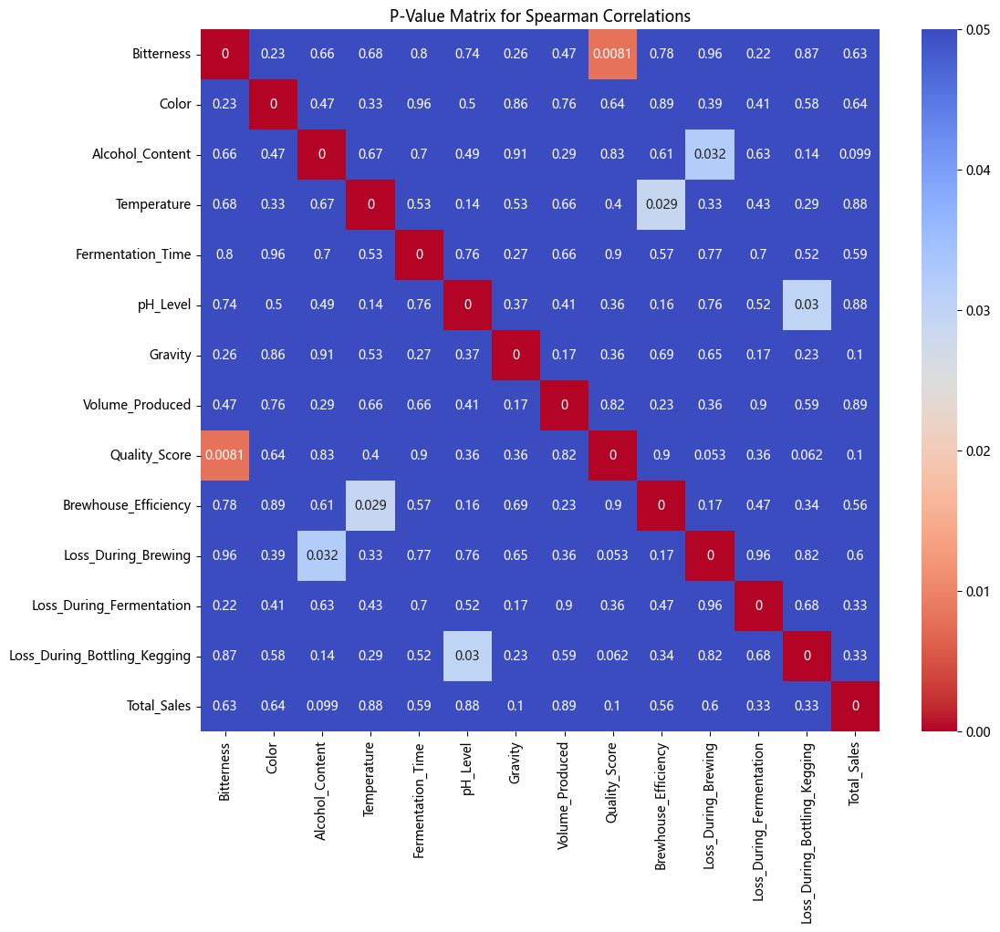

(                             Bitterness     Color Alcohol_Content Temperature  \
 Bitterness                            1 -0.000382        0.000137     0.00013   
 Color                         -0.000382         1       -0.000229    0.000309   
 Alcohol_Content                0.000137 -0.000229               1   -0.000133   
 Temperature                     0.00013  0.000309       -0.000133           1   
 Fermentation_Time              -0.00008 -0.000016        0.000123    0.000198   
 pH_Level                       0.000106  0.000215         0.00022   -0.000465   
 Gravity                        0.000353  0.000057       -0.000035    0.000198   
 Volume_Produced                -0.00023 -0.000097        0.000333    0.000139   
 Quality_Score                 -0.000837 -0.000149        0.000069    0.000266   
 Brewhouse_Efficiency          -0.000087  0.000044        0.000161   -0.000691   
 Loss_During_Brewing           -0.000015  0.000272       -0.000678    0.000307   
 Loss_During_Fer

In [16]:
#Spearman - 連續型變數間非線性關係
def spearman_correlation_matrix(df, continuous_vars):
    corr_matrix = pd.DataFrame(index=continuous_vars, columns=continuous_vars)
    p_value_matrix = pd.DataFrame(index=continuous_vars, columns=continuous_vars)

    for var1 in continuous_vars:
        for var2 in continuous_vars:
            if var1 != var2:
                corr, p = spearmanr(df[var1], df[var2])
                corr_matrix.loc[var1, var2] = corr
                p_value_matrix.loc[var1, var2] = p
            else:
                corr_matrix.loc[var1, var2] = 1  # 
                p_value_matrix.loc[var1, var2] = 0  

    # 相關係數表格
    print("Spearman Rank Correlation Coefficients:")
    display(corr_matrix)

    # 相關係數熱力圖
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix.astype(float), annot=True, cmap='coolwarm')
    plt.title('Spearman Rank Correlation Coefficient Matrix')
    plt.show()

    # p值表格
    print("\nP-values for Correlations:")
    display(p_value_matrix)

    # p值熱力圖
    plt.figure(figsize=(12, 10))
    sns.heatmap(p_value_matrix.astype(float), annot=True, cmap='coolwarm_r', vmin=0, vmax=0.05)
    plt.title('P-Value Matrix for Spearman Correlations')
    plt.show()

    return corr_matrix, p_value_matrix


spearman_correlation_matrix(df, numerical_features)